# Project Description

In this project, we are going to use the Fred API to pull down unemployment and participation rate data for US states and plot a comparative graph of this data for each state. With the help of these plots, we can answer questions like:
- Which state had the highest unemployment rate at any given time?
- Which state had the highest participation rate at any given time?

#### Note:
Since I have used my api key, which I cannot publically share, the viewer of this project has two options to be able to run this code on their machine:
1. Visit https://fred.stlouisfed.org/docs/api/api_key.html to request and obtain your own api key.
2. Use the csv files I have created from the data that I had pulled from fred. 

### Imports and preliminary settings.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('fivethirtyeight')
colour_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]

pd.set_option('display.max_columns', 500)

fred_key = 'enter_your_fred_api_key_here'

from fredapi import Fred

- Creating the fred object

In [3]:
fred = Fred(api_key = fred_key)

### Searching for and pulling raw economic data

Fred allows us to search and pull down data directly into pandas, which we can pull in directly and plot it to get a preliminary idea of what our data looks like, or for answering surface level questions.

In [4]:
sp_search = fred.search('S&P',order_by='popularity')
# sp_search.head()

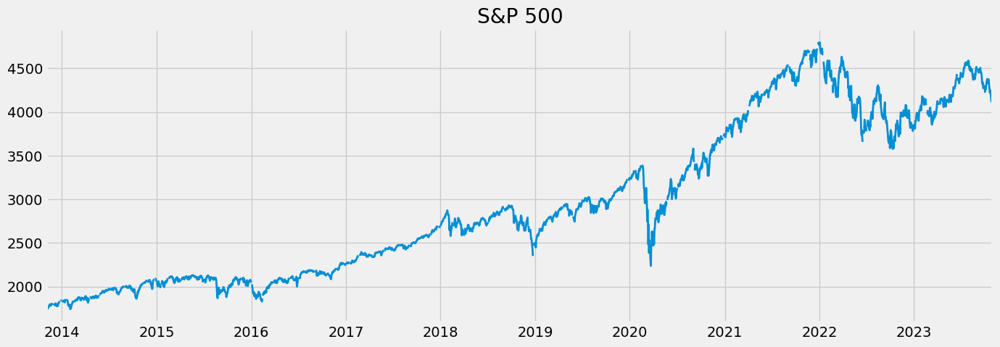

In [7]:
sp500 = fred.get_series(series_id='SP500')
# sp500.to_csv('sp500.csv')
# sp500 = pd.read_csv('sp500.csv')
sp500.plot(figsize = (15,5), lw = '2', title = 'S&P 500')
plt.show()

# Creating a comparison of unemployment rates and participation rates in different states:

First we shall look at the overall, unemployment rate over the years.

In [12]:
unemp_results = fred.search('unemployment')
# unemp_results

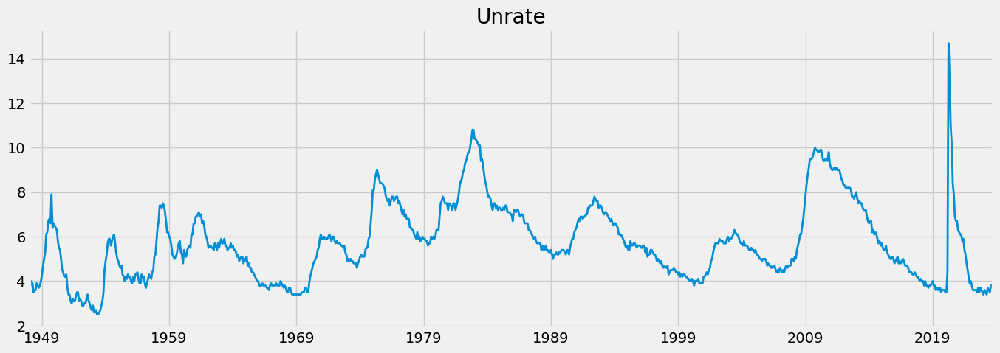

In [13]:
unrate = fred.get_series('UNRATE')
# unrate.to_csv('UNRATE.csv')
# unrate = pd.read_csv('UNRATE.csv')

unrate.plot(figsize = (15,5),title = 'Unrate',lw = '2')
plt.show()

As we can see, there's a huge jump after 2019, most likely due to the pandemic.

### Pulling and joining multiple datasets

Here, we are going to pull unemployment rate per state and combine it into a single dataframe, which we can plot into an interactive line graph using plotly.

In [14]:
unemp_df = fred.search('unemployment rate state',filter = ('frequency','Monthly'))

In [15]:
# unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"').shape

unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')

In [16]:
# unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate in')].shape
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate in')]
unemp_df.to_csv('unemp_df.csv')
# unemp_df = pd.read_csv('unemp_df.csv')

In [17]:
# len(unemp_df.index)
# for myid in unemp_df.index:
     # results = fred.get_series(myid)
     # break
     # putting a break in here in order to just see what the first series in the loop looks like

# results.to_frame(name = myid)
# this command converts it into a dataframe.

In [20]:
all_results = []
for myid in unemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name = myid)
    all_results.append(results)

# type(all_results)
unemp_states = pd.concat(all_results, axis = 1)

In [25]:
unemp_columns = []
for column in unemp_states.columns:
    if len(column) <= 5:
        unemp_columns.append(column)

# unemp_columns

In [26]:
for column in unemp_states.columns:
    if column in unemp_columns:
        pass
    else:
        unemp_states = unemp_states.drop([column],axis = 1)

# unemp_states

In [27]:
id_to_state = unemp_df['title'].str.replace('Unemployment Rate in',"").to_dict()
# id_to_state.update({"Dates" : "Dates"})

In [28]:
# Using list comprehension to change the state codes to the actual state names.
unemp_states.columns = [id_to_state[c] for c in unemp_states.columns]

In [31]:
# id_to_state
# unemp_states.isna().sum(axis = 1).plot(figsize = (15,5), lw = 1)
unemp_states = unemp_states.dropna()
# unemp_states.isna().sum(axis = 1).plot(figsize = (15,5), lw = 1)
# plt.show()

In [313]:
# Since we are using the fred search whitch is an evolving database, I found it wise to create a csv of the data we require.
# This would help avoid us having to remove newly found irrelevant columns from the dataframe, everytime we run the code.

# unemp_states.to_csv('unemp_states.csv')
# unemp_states = pd.read_csv('unemp_states.csv')
# unemp_states

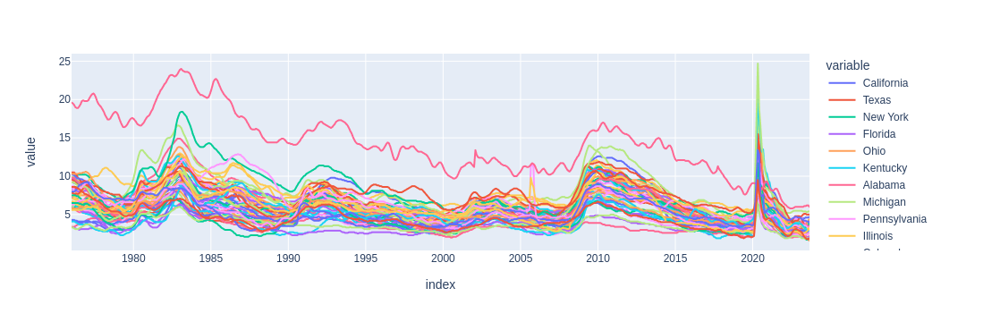

In [32]:
#unemp_states.plot(figsize = (15,5), lw = 1)
# 
# unemp_states = unemp_states.set_index('Dates')
px.line(unemp_states)
# unemp_states

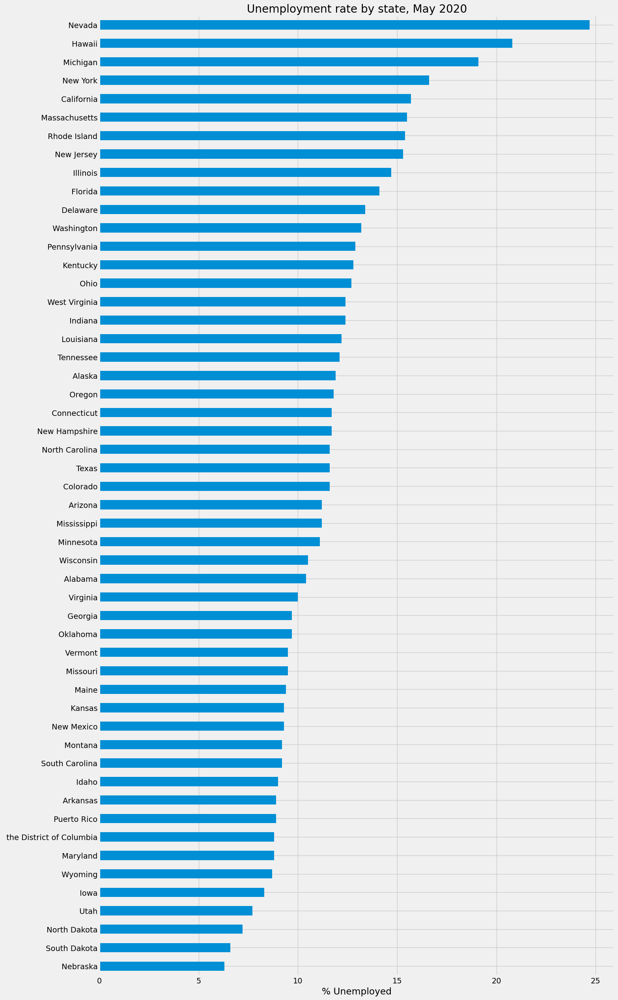

In [33]:
# unemp_states.loc[unemp_states.index == '2020-05-01']
ax = unemp_states.loc[unemp_states.index == '2020-05-01'].T\
    .sort_values('2020-05-01')\
    .plot(kind = 'barh',figsize = (15,30), title = 'Unemployment rate by state, May 2020')

ax.legend().remove()
ax.set_xlabel("% Unemployed")
plt.show()
# unemp_states.index == '2020-05-01'

### Pulling participation rate data:

In [35]:
part_df = fred.search('Labor Force Participation Rate for state', filter = ('frequency', 'Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')

In [36]:
# part_df
# .plot(figsize = (15,5),lw=1)

In [37]:
part_id_to_state = part_df['title'].str.replace('Labor Force Participation Rate for','')\
    .to_dict()

In [39]:
# part_id_to_state

In [40]:
all_results_part = []
for myid in part_df.index:
    results_part = fred.get_series(myid)
    results_part = results_part.to_frame(name = myid)
    all_results_part.append(results_part)

# type(all_results)
part_states = pd.concat(all_results_part, axis = 1)

# part_states

In [41]:
part_columns = []
for column in part_states.columns:
    if len(column) <= 9:
        part_columns.append(column)

# part_columns

In [42]:
for column in part_states.columns:
    if column in part_columns:
        pass
    else:
        part_states = part_states.drop([column],axis = 1)

# part_states

In [43]:
part_states.columns = [part_id_to_state[c] for c in part_states.columns]
# part_states

In [53]:
# part_states = part_states.drop(['Labor Force Participation Rate'], axis = 1)
# part_states.to_csv('part_states.csv')
# part_states = pd.read_csv('part_states.csv')
# part_states

In [51]:
# part_states.isna().sum(axis = 1).plot(figsize = (15,5), lw = 1)
part_states = part_states.dropna()
# part_states.isna().sum(axis = 1).plot(figsize = (15,5), lw = 1)

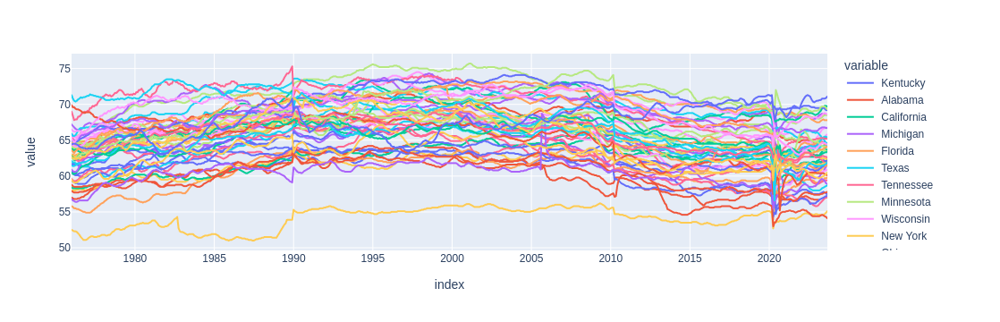

In [52]:
# part_states = part_states.set_index('Dates')
px.line(part_states)

## Plotting Unemployment vs participation:

In [328]:
# pd.to_datetime(unemp_states.index)
# pd.to_datetime(part_states.index)

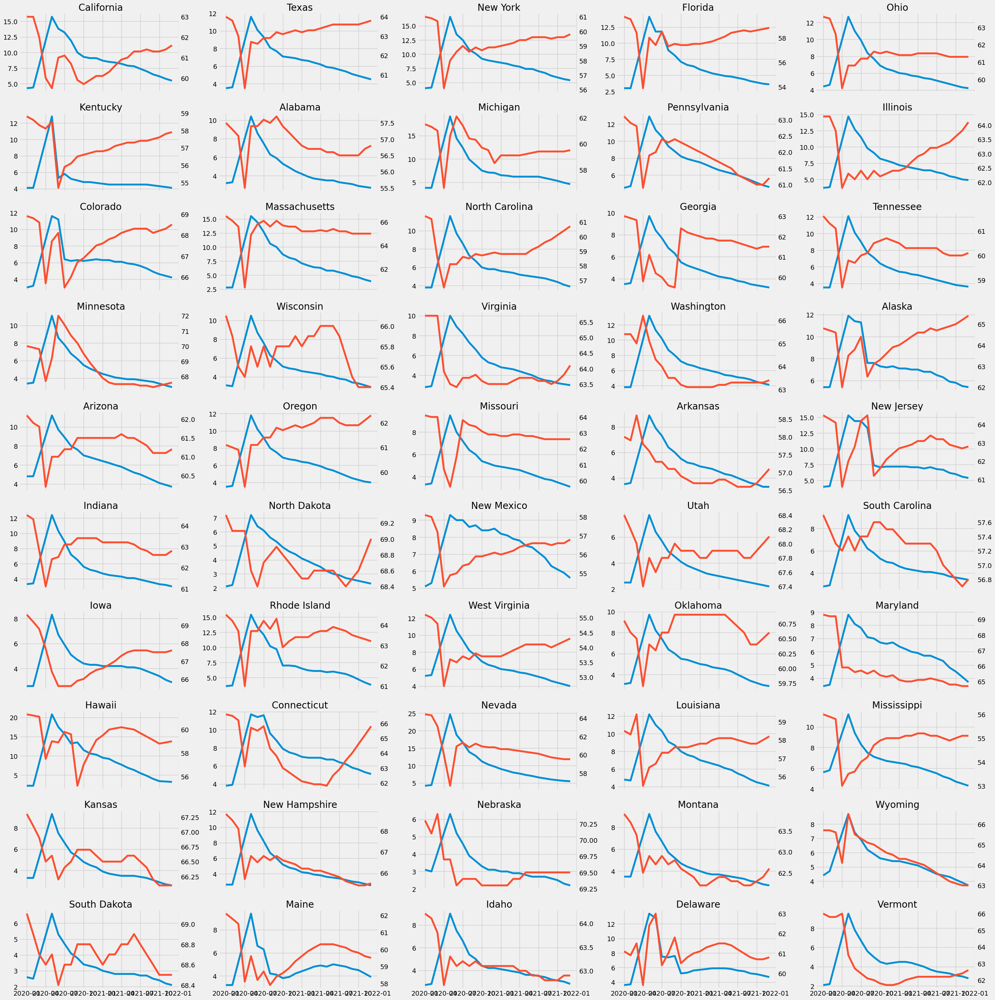

In [54]:
fig, axs = plt.subplots(10,5, figsize= (30,30), sharex=True)
axs = axs.flatten()

i = 0
for state in unemp_states.columns:
    if state == ' the District of Columbia':
        continue
    if state == ' Puerto Rico':
        continue
    ax2 = axs[i].twinx()
    axs[i].plot(unemp_states.query('index >= 2020 and index < 2022')[state]) 
    axs[i].set_label = ('Unemployment')
    # ax.grid(False)
    ax2.plot(part_states.query('index >= 2020 and index < 2022')[state], color = colour_pal[1]) 
    ax2.set_label = ('Participation')
    ax2.grid(False)
    axs[i].set_title(state)
    i += 1
    
plt.tight_layout()
plt.show()
    